In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import math

from unet import UNetModel
from attr_classifier import FaceAttrModel
from diffusion import GaussianDiffusion

import tqdm
import matplotlib.pyplot as plt

In [2]:
# Load DDPM model
device = torch.device('cuda:0')

diff_net = UNetModel(image_size=256, in_channels=3, out_channels=6, 
                     model_channels=256, num_res_blocks=2, channel_mult=(1, 1, 2, 2, 4, 4),
                     attention_resolutions=[32,16,8], num_head_channels=64, dropout=0.1, resblock_updown=True, use_scale_shift_norm=True).to(device)
diff_net.load_state_dict(torch.load('models/ffhq.pt'))
print('Loaded Diffusion Model')

/tmp/ipykernel_253932/2750128590.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  diff_net.load_state_dict(torch.load('models/ffhq.pt'))


Loaded Diffusion Model


In [3]:
face_attributes = ['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 
                   'Bangs', 'Big_Lips', 'Big_Nose','Black_Hair', 'Blond_Hair',
                   'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 
                   'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 
                   'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard', 
                   'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 
                   'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 
                   'Wearing_Hat','Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie', 'Young' 
]

# Load face attribute model
attr_model = FaceAttrModel(pretrained=False, selected_attrs=face_attributes).to(device)
attr_model.load_state_dict(torch.load('models/Resnet18.pth', map_location='cuda:0'))
print('Loaded attributes model')

Loaded attributes model


/home/tovitu/miniconda3/envs/ml/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/tovitu/miniconda3/envs/ml/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/tmp/ipykernel_253932/1603315769.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will 

In [8]:
# MSE loss - Which attributes to consider
# Attribute values
target_attributes = {
    '5_o_Clock_Shadow': 0,
    'Arched_Eyebrows': 0,
    'Attractive': 0,
    'Bags_Under_Eyes': 0,
    'Bald': 0,
    'Bangs': 0,
    'Big_Lips': 0,
    'Big_Nose': 0,
    'Black_Hair': 0,
    'Blond_Hair': 0,
    'Blurry': 0,
    'Brown_Hair': 0,
    'Bushy_Eyebrows': 0,
    'Chubby': 0,
    'Double_Chin': 0,
    'Eyeglasses': 0,
    'Goatee': 0,
    'Gray_Hair': 0,
    'Heavy_Makeup': 0,
    'High_Cheekbones': 0,
    'Male': 0,
    'Mouth_Slightly_Open': 0,
    'Mustache': 0,
    'Narrow_Eyes': 0,
    'No_Beard': 0,
    'Oval_Face': 0,
    'Pale_Skin': 0,
    'Pointy_Nose': 0,
    'Receding_Hairline': 0,
    'Rosy_Cheeks': 0,
    'Sideburns': 0,
    'Smiling': 0,
    'Straight_Hair': 0,
    'Wavy_Hair': 0,
    'Wearing_Earrings': 0,
    'Wearing_Hat': 0,
    'Wearing_Lipstick': 0,
    'Wearing_Necklace': 0,
    'Wearing_Necktie': 0,
    'Young': 1, # 0 corresponds to young, 1 corresponds to old
}
mask = {key: 0 for key in target_attributes.keys()}
mask['Blond_Hair'] = 1

# Convert to tensors
target_attributes = torch.tensor([target_attributes[face_attributes[i]] for i in range(len(face_attributes))]).view(1,len(face_attributes)).float().to(device)
mask = torch.tensor([mask[face_attributes[i]] for i in range(len(face_attributes))]).view(1,len(face_attributes)).float().to(device)

In [9]:
diffusion = GaussianDiffusion(T=1000, schedule='linear')

In [10]:
# Transforms to apply to attribute classifier input
def transform_cls_input(img, prob=0.5):    
    # Horizontal flip
    p = np.random.rand()
    if p < prob:
        img = torchvision.transforms.functional.hflip(img)
    
    # Brightness perturbation
    p = np.random.rand()
    if p < prob:
        b = np.random.rand() * (0.2 + 0.2) - 0.2
        img = img*(1+b)
    
    # Blur
    p = np.random.rand()
    if p < prob:
        sigma = np.random.rand() * 5
        img = torchvision.transforms.functional.gaussian_blur(img, 7, sigma)
        
    return img

# Original Method

  0%|          | 0/200 [00:00<?, ?it/s, Loss=3.55]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


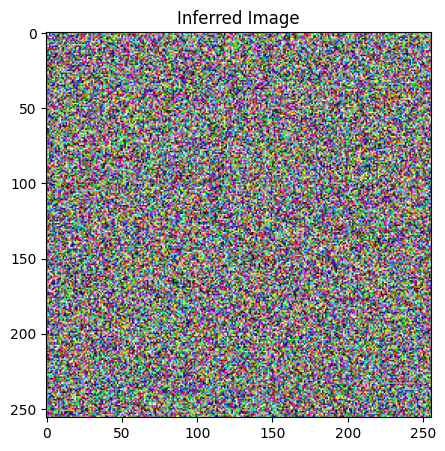

 12%|█▏        | 24/200 [00:08<00:59,  2.95it/s, Loss=1.66]

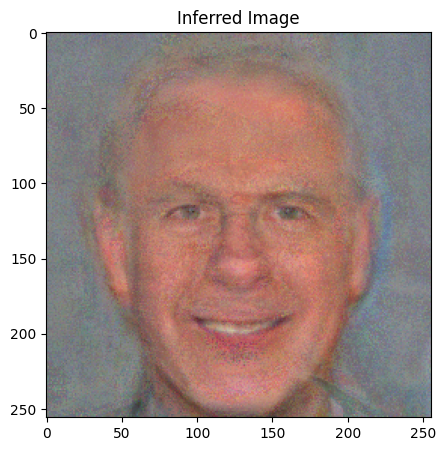

 24%|██▍       | 49/200 [00:16<00:51,  2.94it/s, Loss=1.01]

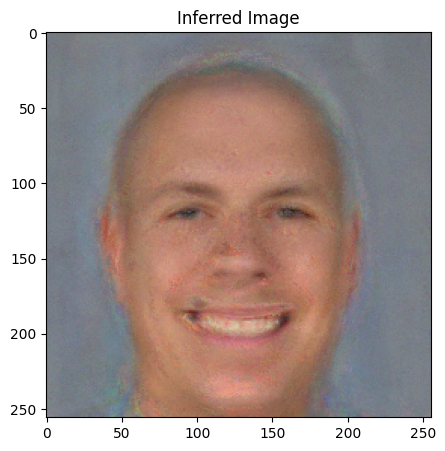

 37%|███▋      | 74/200 [00:25<00:44,  2.84it/s, Loss=1.86] 

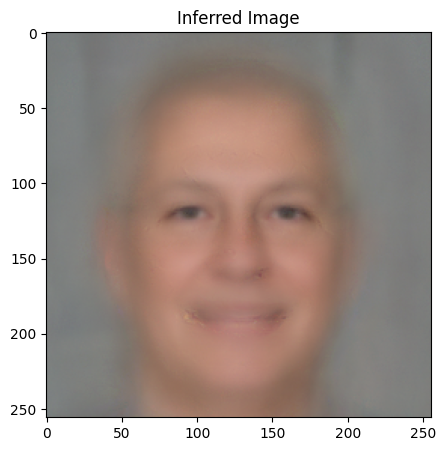

 50%|████▉     | 99/200 [00:34<00:34,  2.91it/s, Loss=2.32]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


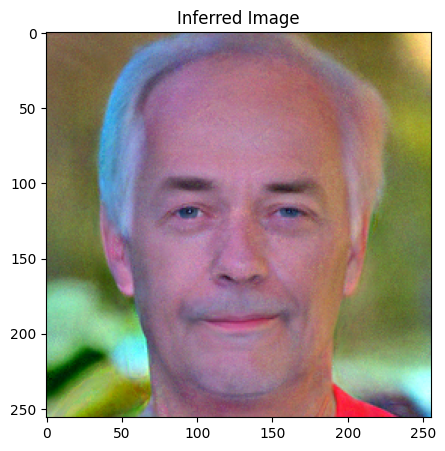

 62%|██████▏   | 124/200 [00:43<00:25,  2.94it/s, Loss=0.875]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


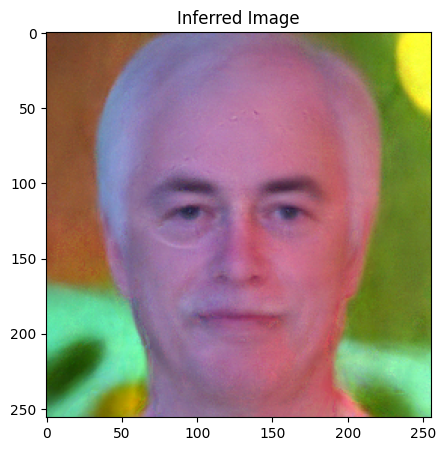

 74%|███████▍  | 149/200 [00:51<00:17,  2.94it/s, Loss=1.59] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


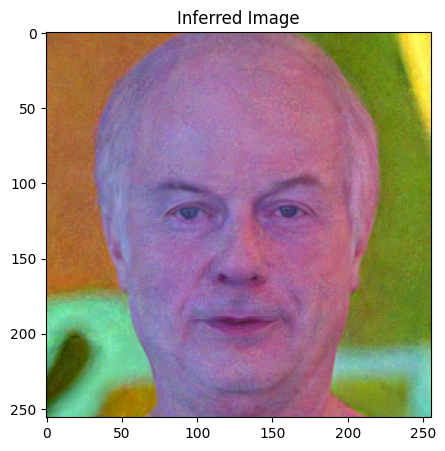

 87%|████████▋ | 174/200 [01:00<00:08,  2.95it/s, Loss=1.14]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


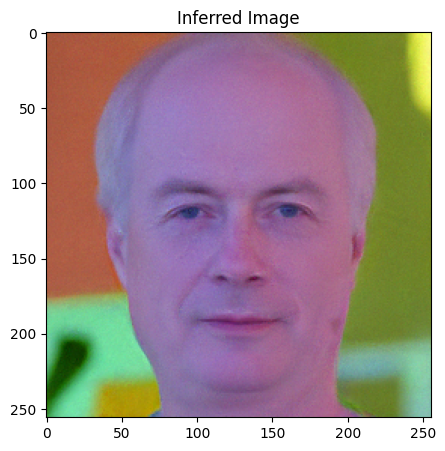

100%|█████████▉| 199/200 [01:09<00:00,  2.94it/s, Loss=1.44]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


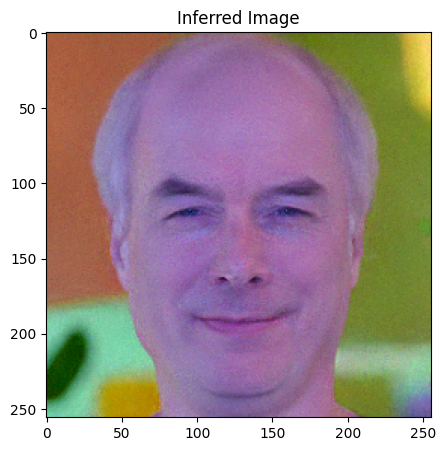

100%|██████████| 200/200 [01:09<00:00,  2.88it/s, Loss=1.44]


In [13]:
class InferenceModel(nn.Module):
    def __init__(self):
        super(InferenceModel, self).__init__()
        # Inferred image
        self.img = nn.Parameter(torch.randn(1,3,256,256))
        self.img.requires_grad = True

    def encode(self):
        return self.img
model = InferenceModel().to(device)
model.train()

# Inference procedure steps
steps = 200   

opt = torch.optim.Adamax(model.parameters(), lr=1)
# Optional: Linearly decrease learning rate
scheduler = torch.optim.lr_scheduler.LinearLR(opt, start_factor=1, end_factor=1, total_iters=steps)

diffusion = GaussianDiffusion(T=1000, schedule='linear')
diff_net.eval()
attr_model.eval()

norm_track = 0
bar = tqdm.tqdm(range(steps))
losses = []
update_every = 10
for i, _ in enumerate(bar):  
    # Select t      
    t = ((steps-i)/1.5 + (steps-i)/3*math.cos(i/10))/steps*800 + 200 # Linearly decreasing + cosine
    t = np.array([t + np.random.randint(-50, 51) for _ in range(1)]).astype(int) # Add noise to t
    t = np.clip(t, 1, diffusion.T)
       
    # Denoise
    sample_img = model.encode()
    xt, epsilon = diffusion.sample(sample_img, t)       
    t = torch.from_numpy(t).float().view(1)    
    pred = diff_net(xt.float(), t.to(device))   
    epsilon_pred = pred[:,:3,:,:] # Use predicted noise only
    
    # Compute diffusion loss
    loss = F.mse_loss(epsilon_pred, epsilon) 
    
    # Compute EMA of diffusion loss gradient norm
    opt.zero_grad()
    loss.backward()
    
    with torch.no_grad():
        grad_norm = torch.linalg.norm(model.img.grad)
        if i > 0:
            alpha = 0.5
            norm_track = alpha*norm_track + (1-alpha)*grad_norm
        else:
            norm_track = grad_norm
            
    opt.step()
    
    # Evaluate attribute classifier on batch of randomly transformed inputs
    attr_batch_size = 8
    attr_input_batch = []
    for j in range(attr_batch_size):
        attr_input = 0.5*(model.encode()+1)
        attr_input = transform_cls_input(attr_input, prob=0.5)
        attr_input = torch.clip(attr_input, 0, 1)
        attr_input = F.interpolate(attr_input, (224,224), mode='nearest')
        attr_input_batch.append(attr_input)
        
    attr_input_batch = torch.cat(attr_input_batch, dim=0)
    attr = attr_model(attr_input_batch)

    # MSE between predicted and target attributes
    #loss = torch.sum(F.mse_loss(torch.sigmoid(attr), target_attributes.tile(attr_batch_size,1), reduction='none')*mask) / mask.sum() / attr_batch_size

    # Maximize/Minimize attribute logits
    loss = -torch.sum(attr*mask.tile(attr_batch_size, 1)) / torch.abs(mask).sum() / attr_batch_size
    
    opt.zero_grad()
    loss.backward()
    # Clip attribute loss gradients
    torch.nn.utils.clip_grad_norm_(model.parameters(), 0.1*norm_track)
    opt.step()
    scheduler.step()

    losses.append(loss.item())
    if i % update_every == 0:
        bar.set_postfix({'Loss': np.mean(losses)})
        losses = []    
        
    # Visualize inferred image
    if (i+1) % 25 == 0 or i == 0:
        with torch.no_grad():
            fig, ax = plt.subplots(1, 1, figsize=(10,5))
            ax.imshow(0.5*(model.encode()+1)[0].cpu().numpy().transpose([1,2,0]))
            ax.set_title('Inferred Image')
            plt.show()

# Intermediate code

  0%|          | 0/200 [00:00<?, ?it/s, Loss=3.93]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


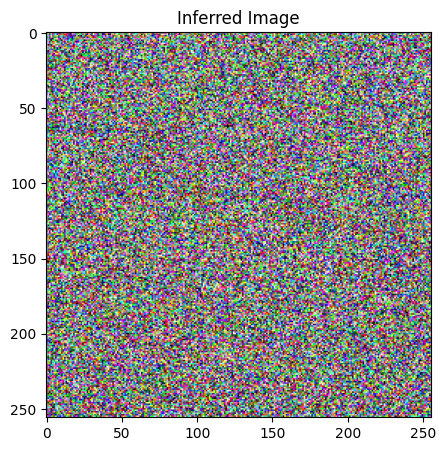

 12%|█▏        | 24/200 [00:08<01:03,  2.78it/s, Loss=2.22]

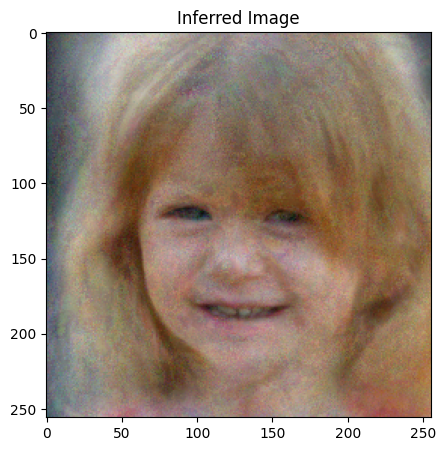

 24%|██▍       | 49/200 [00:17<00:52,  2.90it/s, Loss=0.576]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


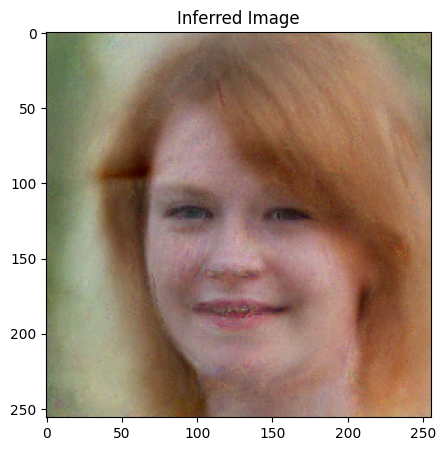

 37%|███▋      | 74/200 [00:25<00:42,  2.96it/s, Loss=0.646]

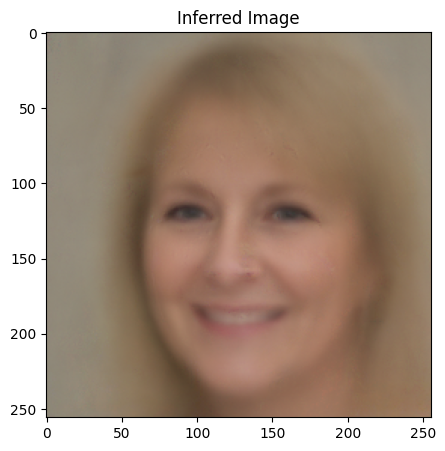

 50%|████▉     | 99/200 [00:34<00:35,  2.85it/s, Loss=1.42] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


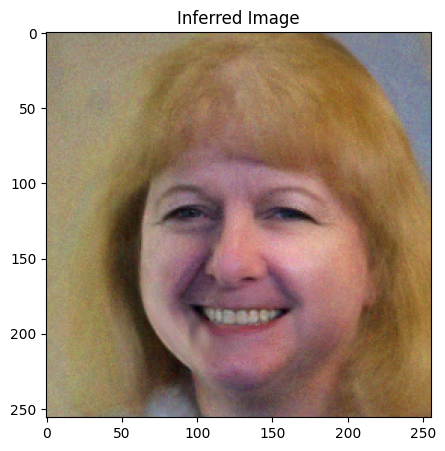

 62%|██████▏   | 124/200 [00:44<00:27,  2.78it/s, Loss=0.68] 

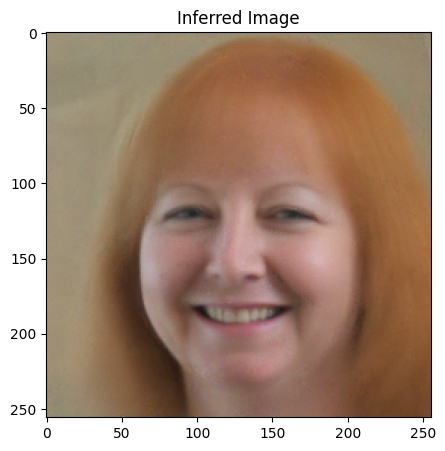

 74%|███████▍  | 149/200 [00:52<00:17,  2.96it/s, Loss=1.37] 

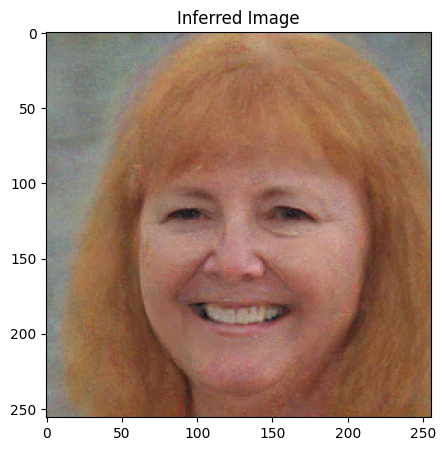

 87%|████████▋ | 174/200 [01:01<00:08,  2.97it/s, Loss=1.09] 

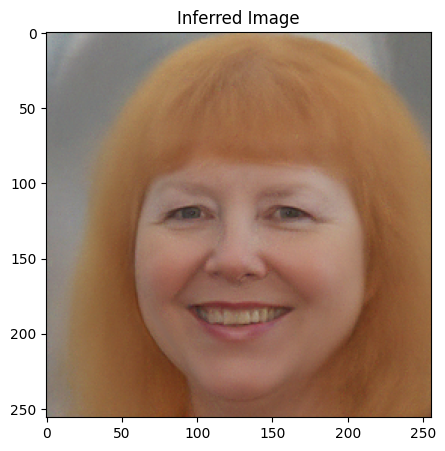

100%|█████████▉| 199/200 [01:09<00:00,  2.81it/s, Loss=1.43] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


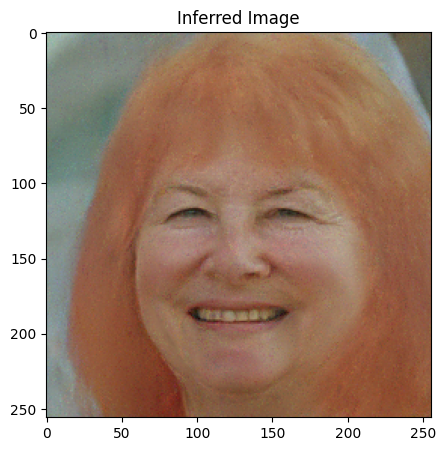

100%|██████████| 200/200 [01:10<00:00,  2.83it/s, Loss=1.43]


In [14]:
class InferenceModel(nn.Module):
    def __init__(self):
        super(InferenceModel, self).__init__()
        # Inferred image
        self.img = nn.Parameter(torch.randn(1,3,256,256))
        self.img.requires_grad = True

    def encode(self):
        return self.img
    
x_admm = InferenceModel().to(device)
x_admm.train()

# Inference procedure steps
steps = 200   

x_opt = torch.optim.Adamax(x_admm.parameters(), lr=1)
# Optional: Linearly decrease learning rate
scheduler = torch.optim.lr_scheduler.LinearLR(opt, start_factor=1, end_factor=1, total_iters=steps)

diffusion = GaussianDiffusion(T=1000, schedule='linear')
diff_net.eval()
attr_model.eval()

norm_track = 0
bar = tqdm.tqdm(range(steps))
losses = []
update_every = 10
for i, _ in enumerate(bar):  
    # Select t      
    t = ((steps-i)/1.5 + (steps-i)/3*math.cos(i/10))/steps*800 + 200 # Linearly decreasing + cosine
    t = np.array([t + np.random.randint(-50, 51) for _ in range(1)]).astype(int) # Add noise to t
    t = np.clip(t, 1, diffusion.T)
       
    # Denoise
    sample_img = x_admm.encode()
    xt, epsilon = diffusion.sample(sample_img, t)       
    t = torch.from_numpy(t).float().view(1)    
    pred = diff_net(xt.float(), t.to(device))   
    epsilon_pred = pred[:,:3,:,:] # Use predicted noise only
    
    # Compute diffusion loss
    loss = F.mse_loss(epsilon_pred, epsilon) 
    
    # Compute EMA of diffusion loss gradient norm
    x_opt.zero_grad()
    loss.backward()
    
    with torch.no_grad():
        grad_norm = torch.linalg.norm(x_admm.img.grad)
        if i > 0:
            alpha = 0.5
            norm_track = alpha*norm_track + (1-alpha)*grad_norm
        else:
            norm_track = grad_norm
            
    x_opt.step()
    
    # Evaluate attribute classifier on batch of randomly transformed inputs
    attr_batch_size = 8
    attr_input_batch = []
    for j in range(attr_batch_size):
        attr_input = 0.5*(x_admm.encode()+1)
        attr_input = transform_cls_input(attr_input, prob=0.5)
        attr_input = torch.clip(attr_input, 0, 1)
        attr_input = F.interpolate(attr_input, (224,224), mode='nearest')
        attr_input_batch.append(attr_input)
        
    attr_input_batch = torch.cat(attr_input_batch, dim=0)
    attr = attr_model(attr_input_batch)

    # MSE between predicted and target attributes
    #loss = torch.sum(F.mse_loss(torch.sigmoid(attr), target_attributes.tile(attr_batch_size,1), reduction='none')*mask) / mask.sum() / attr_batch_size

    # Maximize/Minimize attribute logits
    loss = -torch.sum(attr*mask.tile(attr_batch_size, 1)) / torch.abs(mask).sum() / attr_batch_size
    
    x_opt.zero_grad()
    loss.backward()
    # Clip attribute loss gradients
    torch.nn.utils.clip_grad_norm_(x_admm.parameters(), 0.1*norm_track)
    x_opt.step()
    scheduler.step()

    losses.append(loss.item())
    if i % update_every == 0:
        bar.set_postfix({'Loss': np.mean(losses)})
        losses = []    
        
    # Visualize inferred image
    if (i+1) % 25 == 0 or i == 0:
        with torch.no_grad():
            fig, ax = plt.subplots(1, 1, figsize=(10,5))
            ax.imshow(0.5*(x_admm.encode()+1)[0].cpu().numpy().transpose([1,2,0]))
            ax.set_title('Inferred Image')
            plt.show()

# ADMM

  0%|          | 0/200 [00:00<?, ?it/s, Loss=8.33e-5] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


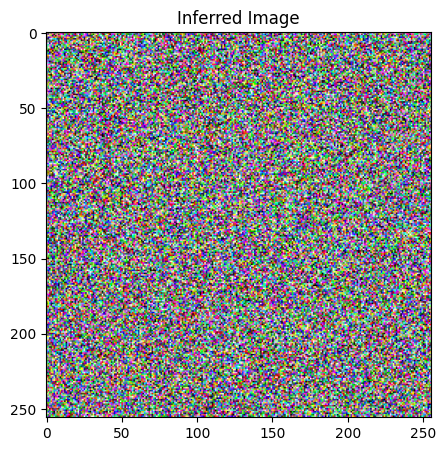

 12%|█▏        | 24/200 [00:10<01:10,  2.49it/s, Loss=-.000441]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


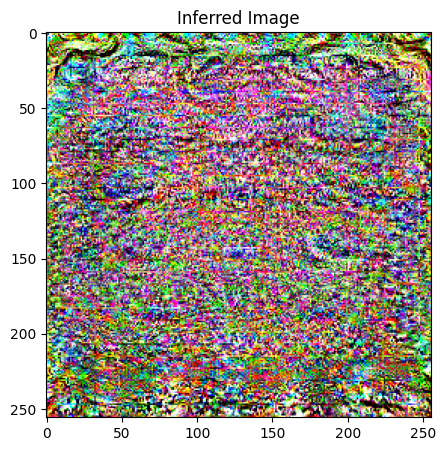

 24%|██▍       | 49/200 [00:20<01:00,  2.49it/s, Loss=-.000498]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


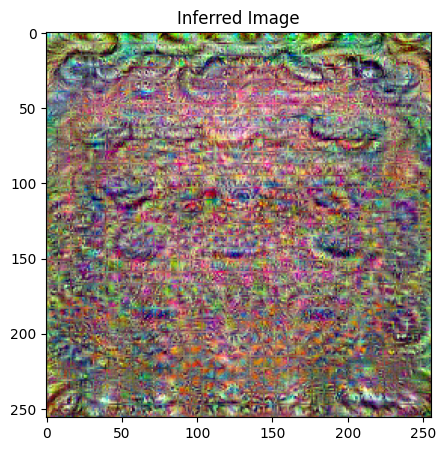

 37%|███▋      | 74/200 [00:30<00:50,  2.48it/s, Loss=-.000344]

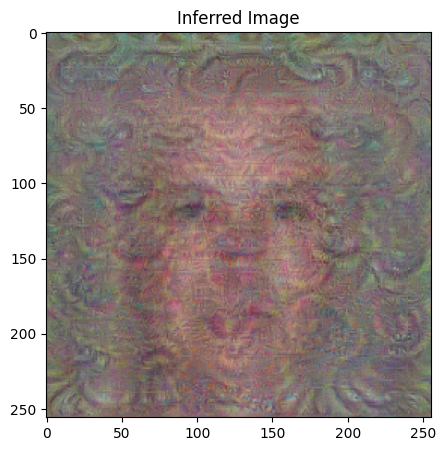

 50%|████▉     | 99/200 [00:40<00:40,  2.50it/s, Loss=-.000185]

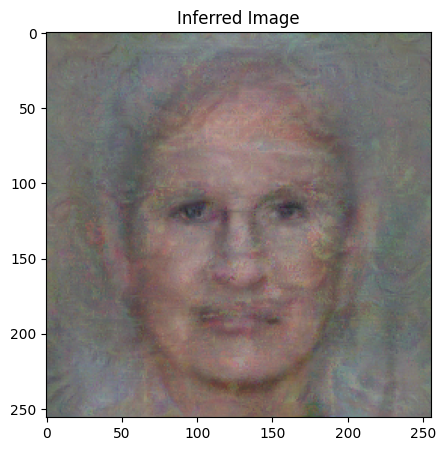

 62%|██████▏   | 124/200 [00:50<00:30,  2.49it/s, Loss=0.00136] 

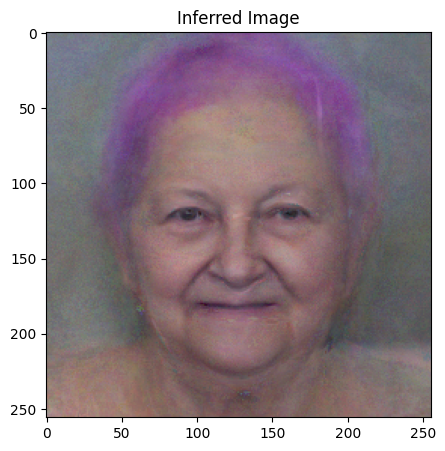

 74%|███████▍  | 149/200 [01:01<00:20,  2.49it/s, Loss=0.00223]

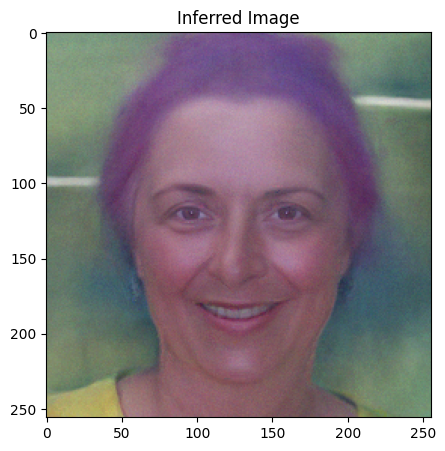

 87%|████████▋ | 174/200 [01:11<00:10,  2.48it/s, Loss=0.018]  Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


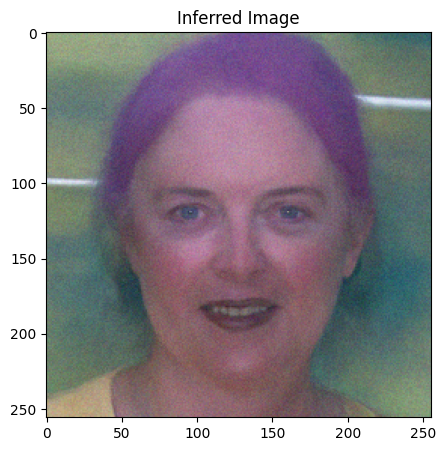

100%|█████████▉| 199/200 [01:20<00:00,  3.01it/s, Loss=0.018]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


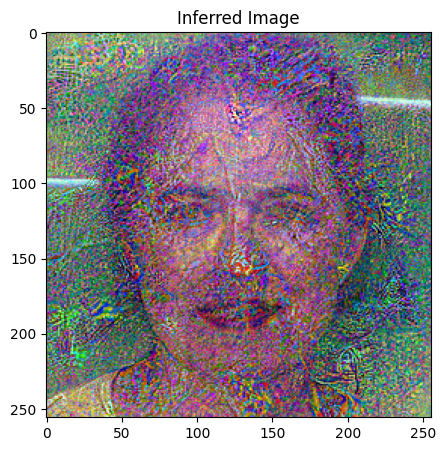

100%|██████████| 200/200 [01:20<00:00,  2.48it/s, Loss=0.018]


In [28]:
class InferenceModel(nn.Module):
    def __init__(self):
        super(InferenceModel, self).__init__()
        # Inferred image
        self.img = nn.Parameter(torch.randn(1,3,256,256))
        self.img.requires_grad = True

    def encode(self):
        return self.img

# x variable
x_admm = InferenceModel().to(device)
x_admm.train()

opt_x = torch.optim.Adamax(x_admm.parameters(), lr=1)

# z variable
z_admm = InferenceModel().to(device)
z_admm.load_state_dict(x_admm.state_dict())
z_admm.train()

opt_z = torch.optim.Adamax(z_admm.parameters(), lr=1e-1)

u = torch.zeros_like(x_admm.img).to(device)
u.requires_grad = False

# ADMM parameters
rho = 1e-7  # Penalty parameter
lambda_param = 5e-3  # Weight for asymmetry loss

# Prepare Models    
diffusion = GaussianDiffusion(T=1000, schedule='linear')
diff_net.eval()
attr_model.eval()

# Inference procedure steps
steps = 200   

norm_track = 0
bar = tqdm.tqdm(range(steps))
losses = []
update_every = 10
for i, _ in enumerate(bar):  
    # Select t      
    t = (steps-i)/steps*1000
    t = np.array([t + np.random.randint(-50, 51) for _ in range(1)]).astype(int) # Add noise to t
    t = np.clip(t, 1, diffusion.T)
       
    # Denoise
    sample_img = x_admm.encode()
    xt, epsilon = diffusion.sample(sample_img, t)       
    t = torch.from_numpy(t).float().view(1)    
    pred = diff_net(xt.float(), t.to(device))   
    epsilon_pred = pred[:,:3,:,:] # Use predicted noise only
    
    # Compute diffusion loss
    denoise_loss = F.mse_loss(epsilon_pred, epsilon)
    x_loss = denoise_loss + (rho / 2) * torch.norm(x_admm.img - z_admm.img.detach() + u) ** 2
    
    # Compute EMA of diffusion loss gradient norm
    x_loss.backward()

    with torch.no_grad():
        grad_norm = torch.linalg.norm(x_admm.img.grad)
        if i > 0:
            alpha = 0.5
            norm_track = alpha*norm_track + (1-alpha)*grad_norm
        else:
            norm_track = grad_norm
            
    opt_x.step()
    opt_x.zero_grad()
    
    # Evaluate attribute classifier on batch of randomly transformed inputs

    if i <= steps - 25:
        
        for _ in range(5):
            attr_batch_size = 8
            attr_input_batch = []
            for j in range(attr_batch_size):
                attr_input = 0.5*(z_admm.encode()+1)
                attr_input = transform_cls_input(attr_input, prob=0.5)
                attr_input = torch.clip(attr_input, 0, 1)
                attr_input = F.interpolate(attr_input, (224,224), mode='nearest')
                attr_input_batch.append(attr_input)
                
            attr_input_batch = torch.cat(attr_input_batch, dim=0)
            attr = attr_model(attr_input_batch)

            # Maximize/Minimize attribute logits
            cls_loss = -torch.sum(attr*mask.tile(attr_batch_size, 1)) / torch.abs(mask).sum() / attr_batch_size
            z_loss = 0.01 *(steps-i)/steps * lambda_param * cls_loss + (rho / 2) * torch.norm(x_admm.img.detach() - z_admm.img + u) ** 2
            
            z_loss.backward()
            
            # Clip attribute loss gradients
            #torch.nn.utils.clip_grad_norm_(z_admm.parameters(), norm_track)
            opt_z.step()
            opt_z.zero_grad()

            losses.append(x_loss.item() + z_loss.item())
            if i % update_every == 0:
                bar.set_postfix({'Loss': np.mean(losses)})
                losses = []    
        
    # Visualize inferred image
    if (i+1) % 25 == 0 or i == 0:
        with torch.no_grad():
            fig, ax = plt.subplots(1, 1, figsize=(10,5))
            ax.imshow(0.5*(x_admm.encode()+1)[0].cpu().numpy().transpose([1,2,0]))
            ax.set_title('Inferred Image')
            plt.show()

# More samples

In [29]:
# MSE loss - Which attributes to consider
# Attribute values
target_attributes = {
    '5_o_Clock_Shadow': 0,
    'Arched_Eyebrows': 0,
    'Attractive': 0,
    'Bags_Under_Eyes': 0,
    'Bald': 0,
    'Bangs': 0,
    'Big_Lips': 0,
    'Big_Nose': 0,
    'Black_Hair': 0,
    'Blond_Hair': 0,
    'Blurry': 0,
    'Brown_Hair': 0,
    'Bushy_Eyebrows': 0,
    'Chubby': 0,
    'Double_Chin': 0,
    'Eyeglasses': 0,
    'Goatee': 0,
    'Gray_Hair': 0,
    'Heavy_Makeup': 0,
    'High_Cheekbones': 0,
    'Male': 0,
    'Mouth_Slightly_Open': 0,
    'Mustache': 0,
    'Narrow_Eyes': 0,
    'No_Beard': 0,
    'Oval_Face': 0,
    'Pale_Skin': 0,
    'Pointy_Nose': 0,
    'Receding_Hairline': 0,
    'Rosy_Cheeks': 0,
    'Sideburns': 0,
    'Smiling': 0,
    'Straight_Hair': 0,
    'Wavy_Hair': 0,
    'Wearing_Earrings': 0,
    'Wearing_Hat': 0,
    'Wearing_Lipstick': 0,
    'Wearing_Necklace': 0,
    'Wearing_Necktie': 0,
    'Young': 1, # 0 corresponds to young, 1 corresponds to old
}
mask = {key: 0 for key in target_attributes.keys()}
mask['Young'] = 0
mask['Eyeglasses'] = 1


# Convert to tensors
target_attributes = torch.tensor([target_attributes[face_attributes[i]] for i in range(len(face_attributes))]).view(1,len(face_attributes)).float().to(device)
mask = torch.tensor([mask[face_attributes[i]] for i in range(len(face_attributes))]).view(1,len(face_attributes)).float().to(device)

  0%|          | 0/200 [00:00<?, ?it/s, Loss=0.000163]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


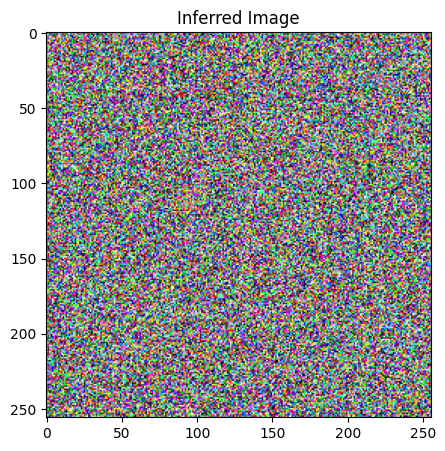

 12%|█▏        | 24/200 [00:10<01:10,  2.50it/s, Loss=-.000131]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


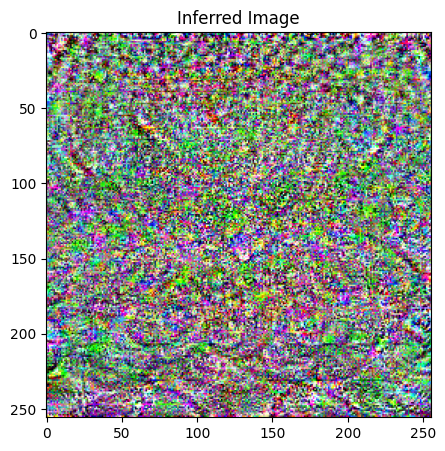

 24%|██▍       | 49/200 [00:20<01:00,  2.49it/s, Loss=-9e-5]   Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


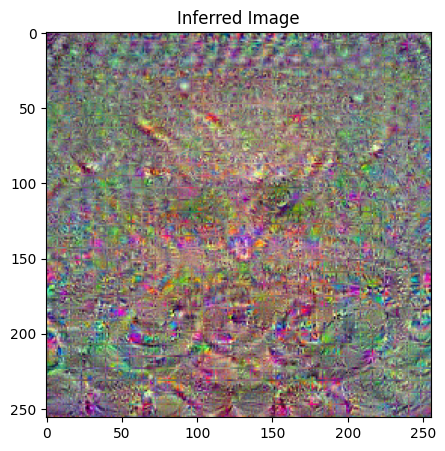

 37%|███▋      | 74/200 [00:30<00:50,  2.51it/s, Loss=-.000118]

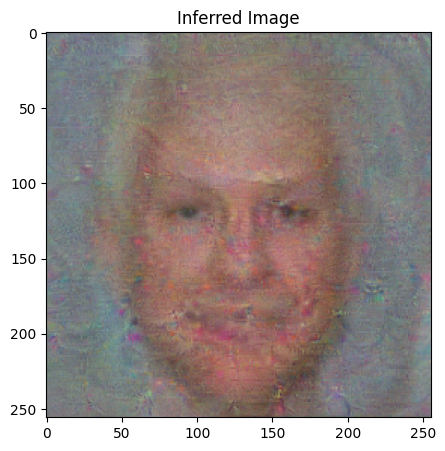

 50%|████▉     | 99/200 [00:40<00:40,  2.48it/s, Loss=0.000463]

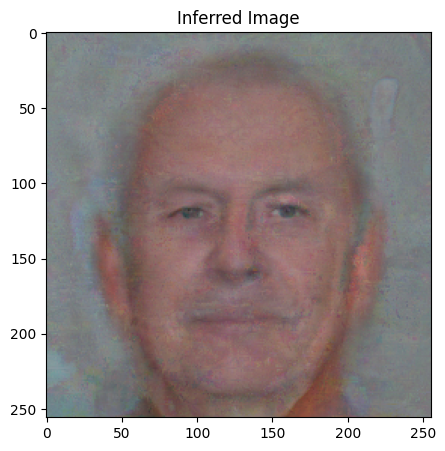

 62%|██████▏   | 124/200 [00:51<00:30,  2.48it/s, Loss=0.000876]

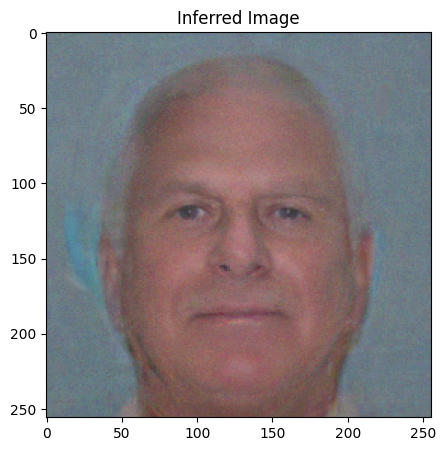

 74%|███████▍  | 149/200 [01:01<00:20,  2.47it/s, Loss=0.00147] 

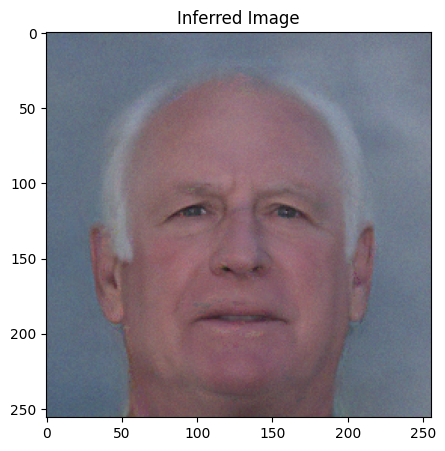

 87%|████████▋ | 174/200 [01:11<00:10,  2.50it/s, Loss=0.00998]

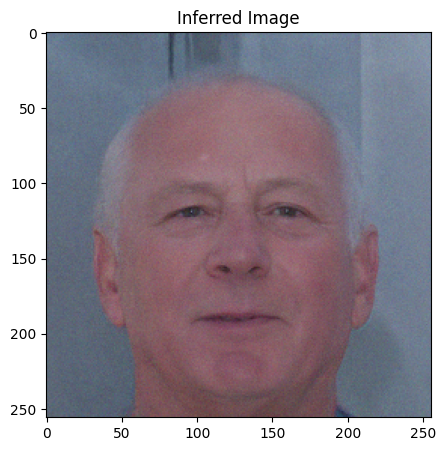

100%|█████████▉| 199/200 [01:20<00:00,  2.99it/s, Loss=0.00998]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


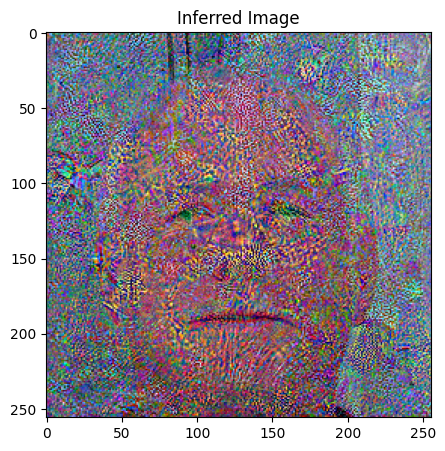

100%|██████████| 200/200 [01:20<00:00,  2.48it/s, Loss=0.00998]


In [30]:
class InferenceModel(nn.Module):
    def __init__(self):
        super(InferenceModel, self).__init__()
        # Inferred image
        self.img = nn.Parameter(torch.randn(1,3,256,256))
        self.img.requires_grad = True

    def encode(self):
        return self.img

# x variable
x_admm = InferenceModel().to(device)
x_admm.train()

opt_x = torch.optim.Adamax(x_admm.parameters(), lr=1)

# z variable
z_admm = InferenceModel().to(device)
z_admm.load_state_dict(x_admm.state_dict())
z_admm.train()

opt_z = torch.optim.Adamax(z_admm.parameters(), lr=1e-1)

u = torch.zeros_like(x_admm.img).to(device)
u.requires_grad = False

# ADMM parameters
rho = 1e-7  # Penalty parameter
lambda_param = 5e-3  # Weight for asymmetry loss

# Prepare Models    
diffusion = GaussianDiffusion(T=1000, schedule='linear')
diff_net.eval()
attr_model.eval()

# Inference procedure steps
steps = 200   

norm_track = 0
bar = tqdm.tqdm(range(steps))
losses = []
update_every = 10
for i, _ in enumerate(bar):  
    # Select t      
    t = (steps-i)/steps*1000
    t = np.array([t + np.random.randint(-50, 51) for _ in range(1)]).astype(int) # Add noise to t
    t = np.clip(t, 1, diffusion.T)
       
    # Denoise
    sample_img = x_admm.encode()
    xt, epsilon = diffusion.sample(sample_img, t)       
    t = torch.from_numpy(t).float().view(1)    
    pred = diff_net(xt.float(), t.to(device))   
    epsilon_pred = pred[:,:3,:,:] # Use predicted noise only
    
    # Compute diffusion loss
    denoise_loss = F.mse_loss(epsilon_pred, epsilon)
    x_loss = denoise_loss + (rho / 2) * torch.norm(x_admm.img - z_admm.img.detach() + u) ** 2
    
    # Compute EMA of diffusion loss gradient norm
    x_loss.backward()

    with torch.no_grad():
        grad_norm = torch.linalg.norm(x_admm.img.grad)
        if i > 0:
            alpha = 0.5
            norm_track = alpha*norm_track + (1-alpha)*grad_norm
        else:
            norm_track = grad_norm
            
    opt_x.step()
    opt_x.zero_grad()
    
    # Evaluate attribute classifier on batch of randomly transformed inputs

    if i <= steps - 25:
        
        for _ in range(5):
            attr_batch_size = 8
            attr_input_batch = []
            for j in range(attr_batch_size):
                attr_input = 0.5*(z_admm.encode()+1)
                attr_input = transform_cls_input(attr_input, prob=0.5)
                attr_input = torch.clip(attr_input, 0, 1)
                attr_input = F.interpolate(attr_input, (224,224), mode='nearest')
                attr_input_batch.append(attr_input)
                
            attr_input_batch = torch.cat(attr_input_batch, dim=0)
            attr = attr_model(attr_input_batch)

            # Maximize/Minimize attribute logits
            cls_loss = -torch.sum(attr*mask.tile(attr_batch_size, 1)) / torch.abs(mask).sum() / attr_batch_size
            z_loss = 0.01 *(steps-i)/steps * lambda_param * cls_loss + (rho / 2) * torch.norm(x_admm.img.detach() - z_admm.img + u) ** 2
            
            z_loss.backward()
            
            # Clip attribute loss gradients
            #torch.nn.utils.clip_grad_norm_(z_admm.parameters(), norm_track)
            opt_z.step()
            opt_z.zero_grad()

            losses.append(x_loss.item() + z_loss.item())
            if i % update_every == 0:
                bar.set_postfix({'Loss': np.mean(losses)})
                losses = []    
        
    # Visualize inferred image
    if (i+1) % 25 == 0 or i == 0:
        with torch.no_grad():
            fig, ax = plt.subplots(1, 1, figsize=(10,5))
            ax.imshow(0.5*(x_admm.encode()+1)[0].cpu().numpy().transpose([1,2,0]))
            ax.set_title('Inferred Image')
            plt.show()

In [31]:
# MSE loss - Which attributes to consider
# Attribute values
target_attributes = {
    '5_o_Clock_Shadow': 0,
    'Arched_Eyebrows': 0,
    'Attractive': 0,
    'Bags_Under_Eyes': 0,
    'Bald': 0,
    'Bangs': 0,
    'Big_Lips': 0,
    'Big_Nose': 0,
    'Black_Hair': 0,
    'Blond_Hair': 0,
    'Blurry': 0,
    'Brown_Hair': 0,
    'Bushy_Eyebrows': 0,
    'Chubby': 0,
    'Double_Chin': 0,
    'Eyeglasses': 0,
    'Goatee': 0,
    'Gray_Hair': 0,
    'Heavy_Makeup': 0,
    'High_Cheekbones': 0,
    'Male': 0,
    'Mouth_Slightly_Open': 0,
    'Mustache': 0,
    'Narrow_Eyes': 0,
    'No_Beard': 0,
    'Oval_Face': 0,
    'Pale_Skin': 0,
    'Pointy_Nose': 0,
    'Receding_Hairline': 0,
    'Rosy_Cheeks': 0,
    'Sideburns': 0,
    'Smiling': 0,
    'Straight_Hair': 0,
    'Wavy_Hair': 0,
    'Wearing_Earrings': 0,
    'Wearing_Hat': 0,
    'Wearing_Lipstick': 0,
    'Wearing_Necklace': 0,
    'Wearing_Necktie': 0,
    'Young': 1, # 0 corresponds to young, 1 corresponds to old
}
mask = {key: 0 for key in target_attributes.keys()}
mask['Eyeglasses'] = 1
mask['Mustache'] = 1
mask['Wearing_Hat'] = 1


# Convert to tensors
target_attributes = torch.tensor([target_attributes[face_attributes[i]] for i in range(len(face_attributes))]).view(1,len(face_attributes)).float().to(device)
mask = torch.tensor([mask[face_attributes[i]] for i in range(len(face_attributes))]).view(1,len(face_attributes)).float().to(device)

  0%|          | 0/200 [00:00<?, ?it/s, Loss=0.000369]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


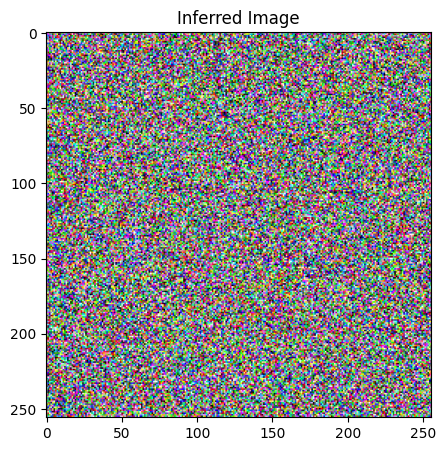

 12%|█▏        | 24/200 [00:10<01:11,  2.47it/s, Loss=0.000338]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


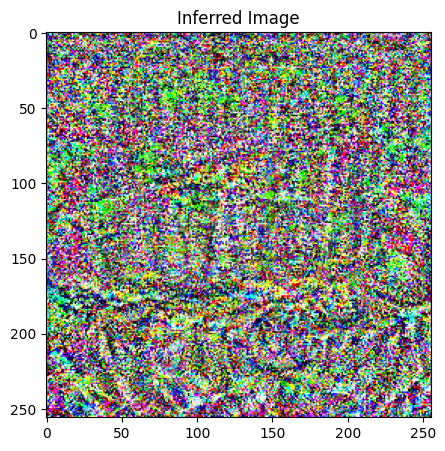

 24%|██▍       | 49/200 [00:20<01:00,  2.50it/s, Loss=0.000768]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


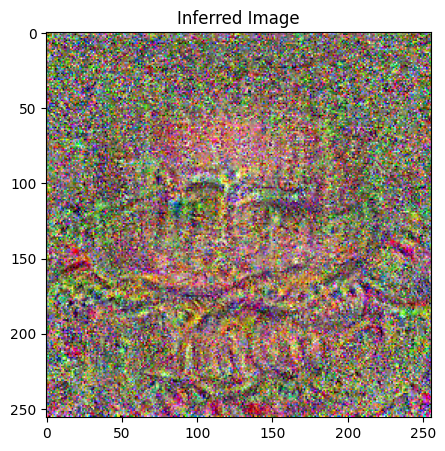

 37%|███▋      | 74/200 [00:30<00:50,  2.48it/s, Loss=0.000686]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


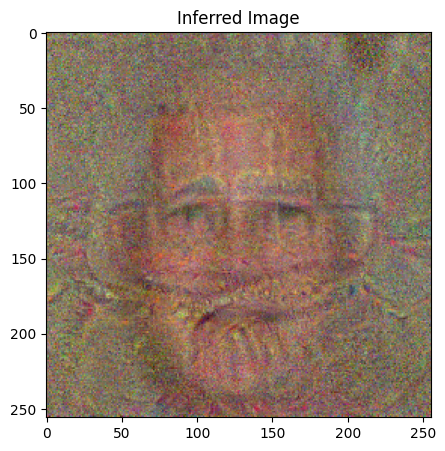

 50%|████▉     | 99/200 [00:40<00:40,  2.48it/s, Loss=0.0008]  

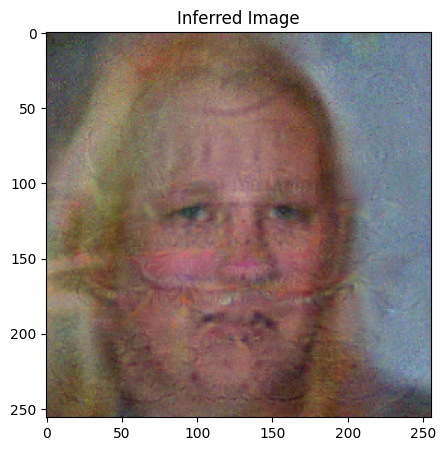

 62%|██████▏   | 124/200 [00:50<00:29,  2.53it/s, Loss=0.00127]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


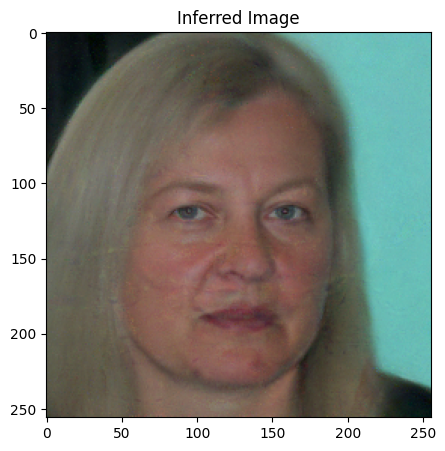

 74%|███████▍  | 149/200 [01:00<00:20,  2.46it/s, Loss=0.00176]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


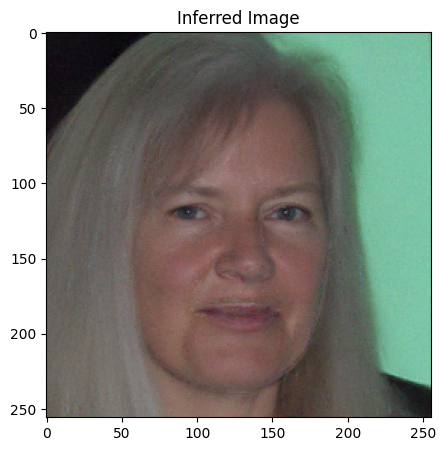

 87%|████████▋ | 174/200 [01:11<00:10,  2.50it/s, Loss=0.0092] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


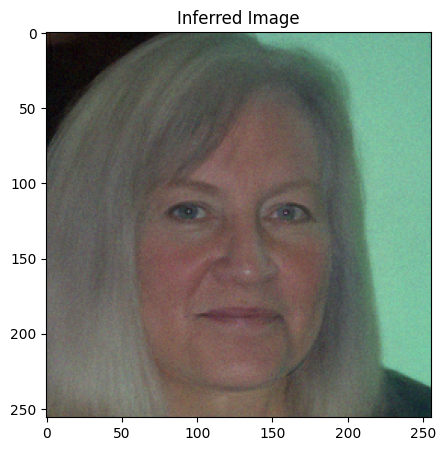

 95%|█████████▌| 190/200 [01:17<00:04,  2.47it/s, Loss=0.0092]


KeyboardInterrupt: 

In [33]:
class InferenceModel(nn.Module):
    def __init__(self):
        super(InferenceModel, self).__init__()
        # Inferred image
        self.img = nn.Parameter(torch.randn(1,3,256,256))
        self.img.requires_grad = True

    def encode(self):
        return self.img

# x variable
x_admm = InferenceModel().to(device)
x_admm.train()

opt_x = torch.optim.Adamax(x_admm.parameters(), lr=1)

# z variable
z_admm = InferenceModel().to(device)
z_admm.load_state_dict(x_admm.state_dict())
z_admm.train()

opt_z = torch.optim.Adamax(z_admm.parameters(), lr=1e-1)

u = torch.zeros_like(x_admm.img).to(device)
u.requires_grad = False

# ADMM parameters
rho = 5e-7  # Penalty parameter
lambda_param = 5e-3  # Weight for asymmetry loss

# Prepare Models    
diffusion = GaussianDiffusion(T=1000, schedule='linear')
diff_net.eval()
attr_model.eval()

# Inference procedure steps
steps = 200   

norm_track = 0
bar = tqdm.tqdm(range(steps))
losses = []
update_every = 10
for i, _ in enumerate(bar):  
    # Select t      
    t = (steps-i)/steps*1000
    t = np.array([t + np.random.randint(-50, 51) for _ in range(1)]).astype(int) # Add noise to t
    t = np.clip(t, 1, diffusion.T)
       
    # Denoise
    sample_img = x_admm.encode()
    xt, epsilon = diffusion.sample(sample_img, t)       
    t = torch.from_numpy(t).float().view(1)    
    pred = diff_net(xt.float(), t.to(device))   
    epsilon_pred = pred[:,:3,:,:] # Use predicted noise only
    
    # Compute diffusion loss
    denoise_loss = F.mse_loss(epsilon_pred, epsilon)
    x_loss = denoise_loss + (rho / 2) * torch.norm(x_admm.img - z_admm.img.detach() + u) ** 2
    
    # Compute EMA of diffusion loss gradient norm
    x_loss.backward()

    with torch.no_grad():
        grad_norm = torch.linalg.norm(x_admm.img.grad)
        if i > 0:
            alpha = 0.5
            norm_track = alpha*norm_track + (1-alpha)*grad_norm
        else:
            norm_track = grad_norm
            
    opt_x.step()
    opt_x.zero_grad()
    
    # Evaluate attribute classifier on batch of randomly transformed inputs

    if i <= steps - 25:
        
        for _ in range(5):
            attr_batch_size = 8
            attr_input_batch = []
            for j in range(attr_batch_size):
                attr_input = 0.5*(z_admm.encode()+1)
                attr_input = transform_cls_input(attr_input, prob=0.5)
                attr_input = torch.clip(attr_input, 0, 1)
                attr_input = F.interpolate(attr_input, (224,224), mode='nearest')
                attr_input_batch.append(attr_input)
                
            attr_input_batch = torch.cat(attr_input_batch, dim=0)
            attr = attr_model(attr_input_batch)

            # Maximize/Minimize attribute logits
            cls_loss = -torch.sum(attr*mask.tile(attr_batch_size, 1)) / torch.abs(mask).sum() / attr_batch_size
            z_loss = 0.01 *(steps-i)/steps * lambda_param * cls_loss + (rho / 2) * torch.norm(x_admm.img.detach() - z_admm.img + u) ** 2
            
            z_loss.backward()
            
            # Clip attribute loss gradients
            #torch.nn.utils.clip_grad_norm_(z_admm.parameters(), norm_track)
            opt_z.step()
            opt_z.zero_grad()

            losses.append(x_loss.item() + z_loss.item())
            if i % update_every == 0:
                bar.set_postfix({'Loss': np.mean(losses)})
                losses = []    
        
    # Visualize inferred image
    if (i+1) % 25 == 0 or i == 0:
        with torch.no_grad():
            fig, ax = plt.subplots(1, 1, figsize=(10,5))
            ax.imshow(0.5*(x_admm.encode()+1)[0].cpu().numpy().transpose([1,2,0]))
            ax.set_title('Inferred Image')
            plt.show()